In [47]:
import numpy as np
import pandas as pd
import shapefile as shp
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Point
from shapely.geometry import LineString
from shapely.geometry.polygon import Polygon
import mapclassify as mc
from scipy import ndimage
import geopandas as gpd
import os
%matplotlib inline
%config InlineBackend.figure_format = 'svg'


In [7]:
os.chdir('/Users/chengchen/Desktop/Insight/project/')

## Draw map of city of Toronto using Toronto shapefile
* data source: https://library.cf.ryerson.ca/madar//geospatial/libdata/action2b.cfm?ResourceID=337  

In [14]:
shp_path ='data/raw/Toronto_shp/Toronto_CMA_01_popn_age_sex_marital.shp'
df_TRT_shp = gpd.read_file(shp_path)
df_TRT_shp.head()

,CTNAME,GEOGRAPHY,CTUID,CMAUID,PRUID,POP01,POP06,POPCHG,L_AREA,POP06RD,...,XCFALN,CFPOP,CFAVG,POP65P,XCF65P,XCF65R,XCF65X,XCF65A,CF65P,geometry
0,0001.00,0001.00 (535000100) 010,5350001.00,535,35,626,571,-8.8,6.10,570,...,70,450,3.0,50,15,0,0,15,35,"POLYGON ((-79.30393646966425 43.6643272879132,..."
1,0002.00,0002.00 (535000200) 000,5350002.00,535,35,658,627,-4.7,3.17,625,...,90,480,2.9,65,15,0,0,10,50,(POLYGON ((-79.35299366051618 43.6340798358691...
2,0003.00,0003.00 (535000300) 000,5350003.00,535,35,0,0,0.0,0.00,0,...,0,0,0.0,0,0,0,0,0,0,POLYGON ((-79.44798780649035 43.63842780120127...
3,0004.00,0004.00 (535000400) 020,5350004.00,535,35,7417,6861,-7.5,0.34,6860,...,1580,4080,2.8,510,310,15,20,270,205,POLYGON ((-79.43598377543616 43.63717191192797...
4,0005.00,0005.00 (535000500) 010,5350005.00,535,35,5438,5089,-6.4,0.38,5090,...,1175,3080,2.8,550,330,20,0,305,220,POLYGON ((-79.42138741235314 43.64066395144786...


* add a column of population density defined by population/land area
* clean the dataframe and only keep useful information

In [16]:
df_TRT_shp['pop_den'] = df_TRT_shp['POP06']/df_TRT_shp['L_AREA']
df_TRT_shp[['POP06','L_AREA','pop_den']].head()
df_TRT_shp.loc[df_TRT_shp['pop_den'].isnull(),'pop_den']=0
df_TRT_shp2 = df_TRT_shp[['CTNAME', 'POP06', 'geometry', 'L_AREA', 'pop_den']].copy()
df_TRT_shp2.head()

,CTNAME,POP06,geometry,L_AREA,pop_den
0,0001.00,571,"POLYGON ((-79.30393646966425 43.6643272879132,...",6.10,93.606557
1,0002.00,627,(POLYGON ((-79.35299366051618 43.6340798358691...,3.17,197.791798
2,0003.00,0,POLYGON ((-79.44798780649035 43.63842780120127...,0.00,0.000000
3,0004.00,6861,POLYGON ((-79.43598377543616 43.63717191192797...,0.34,20179.411765
4,0005.00,5089,POLYGON ((-79.42138741235314 43.64066395144786...,0.38,13392.105263


* take a look at the shapefile
Each color block stands for a Census Tract, the colors stand for population density in that census tract

/Users/chengchen/anaconda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


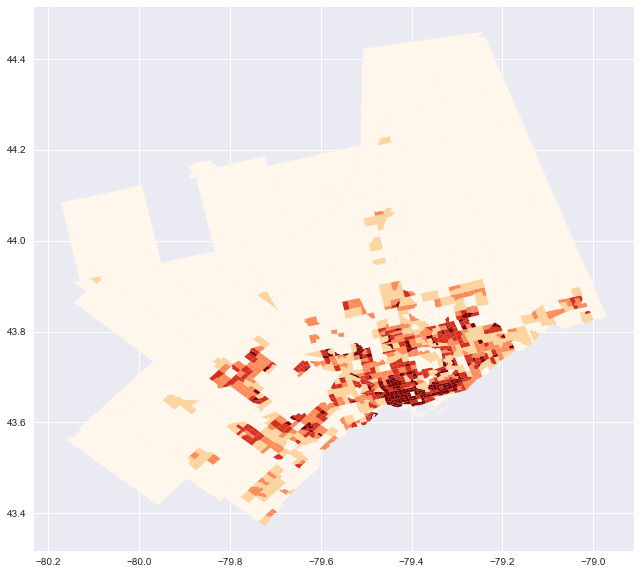

In [24]:
df_TRT_shp2.plot(figsize=(12,10),column='pop_den',cmap='OrRd', scheme='quantiles')


* Create shapefile with coordinate pairs

In [25]:
df_chg_stn = pd.read_excel('data/raw/TRT_charging.xlsx')
df_chg_stn.head()

,ID,Name,latitude,longitude,Rating,Url
0,ChIJF81TbClHK4gRCXbjdNRJ1mQ,ChargePoint Charging Station,43.590949,-79.643401,5.0,https://maps.google.com/?cid=7266076225651832329
1,ChIJP182sGBAK4gRk6rECBRAOtg,ChargePoint Charging Station,43.612652,-79.700167,0.0,https://maps.google.com/?cid=15580836315632282259
2,ChIJr9JOlS9HK4gRhhcvuLNHlN4,ChargePoint Charging Station,43.595825,-79.640320,0.0,https://maps.google.com/?cid=16038523010187990918
3,ChIJi1KuKb1AK4gRZTLlCvo9Sl4,ChargePoint Charging Station,43.618336,-79.669997,0.0,https://maps.google.com/?cid=6794311131975725669
4,ChIJLZBgivRAK4gRiQHjvlXFvu0,ChargePoint Charging Station,43.608837,-79.690693,5.0,https://maps.google.com/?cid=17131347004629385609


* create function that transforms a dataframe to geodataframe

In [26]:
def df_to_gdf(df):
    """takes a dataframe with columns named 'longitude' and 'latitude' 
    to transform to a geodataframe with point features"""
    
    df['coordinates'] = df[['longitude', 'latitude']].values.tolist()
    df['coordinates'] = df['coordinates'].apply(Point)
    df = gpd.GeoDataFrame(df, geometry = 'coordinates')
    return df

In [28]:
gdf_chg_stn = df_to_gdf(df_chg_stn)
gdf_chg_stn.head()

,ID,Name,latitude,longitude,Rating,Url,coordinates
0,ChIJF81TbClHK4gRCXbjdNRJ1mQ,ChargePoint Charging Station,43.590949,-79.643401,5.0,https://maps.google.com/?cid=7266076225651832329,POINT (-79.6434009 43.59094899999999)
1,ChIJP182sGBAK4gRk6rECBRAOtg,ChargePoint Charging Station,43.612652,-79.700167,0.0,https://maps.google.com/?cid=15580836315632282259,POINT (-79.7001667 43.6126516)
2,ChIJr9JOlS9HK4gRhhcvuLNHlN4,ChargePoint Charging Station,43.595825,-79.640320,0.0,https://maps.google.com/?cid=16038523010187990918,POINT (-79.6403201 43.5958254)
3,ChIJi1KuKb1AK4gRZTLlCvo9Sl4,ChargePoint Charging Station,43.618336,-79.669997,0.0,https://maps.google.com/?cid=6794311131975725669,POINT (-79.669997 43.6183355)
4,ChIJLZBgivRAK4gRiQHjvlXFvu0,ChargePoint Charging Station,43.608837,-79.690693,5.0,https://maps.google.com/?cid=17131347004629385609,POINT (-79.6906934 43.608837)


* read other point features

In [29]:
df_foodcourt = pd.read_excel('data/raw/TRT_foodcourt.xlsx')
df_gas = pd.read_excel('data/raw/TRT_gas.xlsx')
df_grocery = pd.read_excel('data/raw/TRT_grocery.xlsx')
df_parking = pd.read_excel('data/raw/TRT_parking.xlsx')
df_restaurant = pd.read_excel('data/raw/TRT_restaurant.xlsx')
df_shopping = pd.read_excel('data/raw/TRT_shopping.xlsx')
df_university = pd.read_excel('data/raw/TRT_university.xlsx')


In [30]:
gdf_foodcourt = df_to_gdf(df_foodcourt)
gdf_gas = df_to_gdf(df_gas)
gdf_grocery = df_to_gdf(df_grocery)
gdf_parking = df_to_gdf(df_parking)
gdf_restaurant = df_to_gdf(df_restaurant)
gdf_shopping = df_to_gdf(df_shopping)
gdf_university = df_to_gdf(df_university)

* take a look at the point features

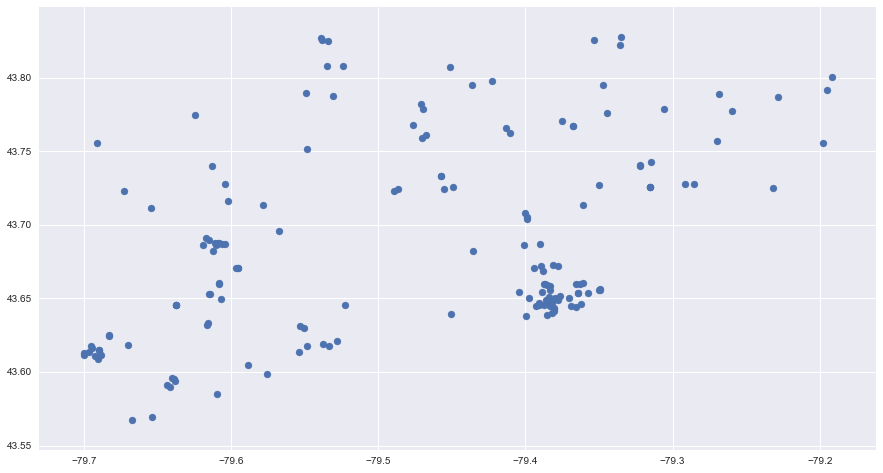

In [31]:
gdf_chg_stn.plot(figsize=(15,10))

* add "line" feature that represents the highways and express ways 

In [37]:
shp_path_roads = 'data/raw/Toronto_roads/CENTRELINE_WGS84.shp'
sf_roads = shp.Reader(shp_path_roads)
# read using geopandas won't work
def read_shapefile(sf):
    """
    Read a shapefile into a Pandas dataframe with a 'coords' 
    column holding the geometry information. This uses the pyshp
    package
    """
    fields = [x[0] for x in sf.fields][1:]
    records = sf.records()
    records = [y[:] for y in sf.records()]
    shps = [s.points for s in sf.shapes()]
    df = pd.DataFrame(columns=fields, data=records)
    df = df.assign(coords=shps)
    return df
df_roads = read_shapefile(sf_roads)

In [38]:
df_roads.head()

,GEO_ID,LFN_ID,LF_NAME,ADDRESS_L,ADDRESS_R,OE_FLAG_L,OE_FLAG_R,LONUML,HINUML,LONUMR,HINUMR,FNODE,TNODE,FCODE,FCODE_DESC,JURIS_CODE,OBJECTID,coords
0,30079678,19155,Waterfront Trl,,,N,N,0,0,0,0,30079676,30079656,204001,Trail,CITY OF TORONTO,189008,"[(-79.544778953, 43.58582902), (-79.544780261,..."
1,30079680,19166,Marie Curtis Park Trl,,,N,N,0,0,0,0,30079676,30079679,204001,Trail,CITY OF TORONTO,189011,"[(-79.544778953, 43.58582902), (-79.544827992,..."
2,30079677,19155,Waterfront Trl,,,N,N,0,0,0,0,30008708,30079676,204001,Trail,CITY OF TORONTO,189009,"[(-79.544542411, 43.586108989), (-79.544641835..."
3,30082310,10685,Island Rd,,,N,N,0,0,0,0,30008708,30082309,201600,Other,PRIVATE,191750,"[(-79.544542411, 43.586108989), (-79.544329712..."
4,30008940,19155,Waterfront Trl,,,N,N,0,0,0,0,30008711,30008708,204001,Trail,CITY OF TORONTO,56495,"[(-79.54386166, 43.586681614), (-79.543997065,..."


In [40]:
df_roads.shape

(69378, 18)

* select only the express ways to show on map

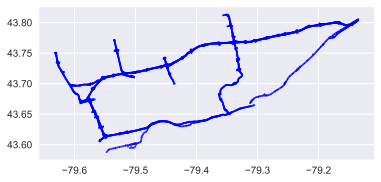

In [49]:
df_expy=df_roads[df_roads['FCODE_DESC'].str.contains('Expressway')]
df_expy=df_expy.append(df_roads[df_roads['LF_NAME'].str.contains('Kingston')])
df_expy=df_expy.append(df_roads[df_roads['LF_NAME'].str.contains('Lake Shore')])
df_expy['coords'] = df_expy['coords'].apply(LineString)
df_expy = gpd.GeoDataFrame(df_expy, geometry = 'coords')
df_expy.plot( color = 'blue', markersize = 10)

* layer the point, line, shapes
keep only city of Toronto

In [50]:
y_lim = ( 43.580438, 43.85) # latitude (boundaries of city of TRT)
x_lim = (-79.659235, -79.128102) # longitude (boundaries of city of TRT)
base = df_TRT_shp2.plot(figsize=(12,10),column='pop_den',cmap='OrRd', scheme='quantiles')
base.set_xlim(x_lim)
base.set_ylim(y_lim)
df_expy.plot(ax = base, color = 'blue')
gdf_foodcourt.plot(ax=base, color = 'yellow', markersize = 12, alpha=0.6)
gdf_parking.plot(ax=base, color = 'cyan', markersize = 12, alpha=0.6)
gdf_chg_stn.plot(ax=base, color = 'green', markersize = 15, alpha=0.6)
plt.savefig('graphs/Density_chg_allfoodcourt_parkinglot_hwy_overlayed.pdf')


/Users/chengchen/anaconda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


## Data Extraction and Generation from the Map
Next, we will split the map to tiny squares and analyze the determination factors for existence/density of charging stations

* extract population density info

In [204]:
selected_cols = ['CTNAME','L_AREA','pop_den', 'geometry']

In [205]:
pop_den = df_TRT_shp[selected_cols]
pop_den.head()

,CTNAME,L_AREA,pop_den,geometry
0,0001.00,6.10,93.606557,"POLYGON ((-79.30393646966425 43.6643272879132,..."
1,0002.00,3.17,197.791798,(POLYGON ((-79.35299366051618 43.6340798358691...
2,0003.00,0.00,0.000000,POLYGON ((-79.44798780649035 43.63842780120127...
3,0004.00,0.34,20179.411765,POLYGON ((-79.43598377543616 43.63717191192797...
4,0005.00,0.38,13392.105263,POLYGON ((-79.42138741235314 43.64066395144786...


* create coordination grid to get population density at each point
* the function below calculates the distance between two points given their geo-coordinates

In [56]:
def cal_dist(lat1, lon1, lat2, lon2):
    radius = 6371 # km, earth radius

    dlat = np.radians(lat2-lat1)
    dlon = np.radians(lon2-lon1)
    a = np.sin(dlat/2) * np.sin(dlat/2) + np.cos(np.radians(lat1)) \
        * np.cos(np.radians(lat2)) * np.sin(dlon/2) * np.sin(dlon/2)
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
    d = radius * c
    return d

lat_range = round(cal_dist(43.582157, -79.639066, 43.792441, -79.639066))
lat_range

23.0

In [57]:
long_range = round(cal_dist(43.582157, -79.639066, 43.582157, -79.118471))
long_range

42.0

In [132]:
# try for now: setting the grid to be 100m*100m
lat_list = np.arange(43.582157, 43.792441, (43.792441-43.582157)/(lat_range*10))
long_list = np.arange(-79.639066, -79.118471, (-79.118471+79.639066)/(long_range*10))
xx,yy = np.meshgrid(lat_list,long_list)
coord_grid = pd.DataFrame(np.array([xx, yy]).reshape(2,-1).T, columns = ['Lat', 'Lon'])
coord_grid['coord']=coord_grid[['Lon', 'Lat']].values.tolist()
coord_grid['coord'] = coord_grid['coord'].apply(Point)
coord_grid_gpd = gpd.GeoDataFrame(coord_grid, geometry = 'coord')
coord_grid.shape

(96600, 3)

In [133]:
coord_grid.head()

,Lat,Lon,coord
0,43.582157,-79.639066,POINT (-79.639066 43.582157)
1,43.583071,-79.639066,POINT (-79.639066 43.58307127826087)
2,43.583986,-79.639066,POINT (-79.639066 43.58398555652175)
3,43.584900,-79.639066,POINT (-79.639066 43.58489983478262)
4,43.585814,-79.639066,POINT (-79.639066 43.58581411304349)


* apply spatial join to overlay point features on the polygon features and obtain information of pop_den for each point

In [206]:
coord_grid_gpd.crs = {'init' :'epsg:4326'}
pop_den.crs == coord_grid_gpd.crs
# re-project grid points to the population layer
coord_grid_gpd = coord_grid_gpd.to_crs(pop_den.crs)
# spatial join
join = gpd.sjoin(coord_grid_gpd, pop_den, how="inner", op="within")
join.head()

,Lat,Lon,coord,test,index_right,CTNAME,L_AREA,pop_den
61267,43.661699,-79.309356,POINT (-79.30935583333469 43.66169920869586),testing,0,0001.00,6.1,93.606557
61498,43.662613,-79.308116,POINT (-79.30811632142994 43.66261348695674),testing,0,0001.00,6.1,93.606557
61268,43.662613,-79.309356,POINT (-79.30935583333469 43.66261348695674),testing,0,0001.00,6.1,93.606557
61499,43.663528,-79.308116,POINT (-79.30811632142994 43.66352776521761),testing,0,0001.00,6.1,93.606557
61729,43.663528,-79.306877,POINT (-79.30687680952518 43.66352776521761),testing,0,0001.00,6.1,93.606557


In [207]:
join.info()
# join is a geopandas dataframe, which tells me for each point, what is the population density

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 64098 entries, 61267 to 94518
Data columns (total 8 columns):
Lat            64098 non-null float64
Lon            64098 non-null float64
coord          64098 non-null object
test           64098 non-null object
index_right    64098 non-null int64
CTNAME         64098 non-null object
L_AREA         64098 non-null float64
pop_den        64098 non-null float64
dtypes: float64(4), int64(1), object(3)
memory usage: 4.4+ MB


In [208]:
join.shape

(64098, 8)

The joined points come out less than all the points in the created grid.
This is because some areas are lake/forest/park/...
We don't need to work with those areas for this analysis.

In [209]:
pop_den.shape 
# 1003 Census Tracts in city of TRT

(1003, 4)

In [210]:
coord_grid_gpd['test']='testing'

In [211]:
coord_grid_gpd.head()

,Lat,Lon,coord,test
0,43.582157,-79.639066,POINT (-79.639066 43.582157),testing
1,43.583071,-79.639066,POINT (-79.639066 43.58307127826087),testing
2,43.583986,-79.639066,POINT (-79.639066 43.58398555652175),testing
3,43.584900,-79.639066,POINT (-79.639066 43.58489983478262),testing
4,43.585814,-79.639066,POINT (-79.639066 43.58581411304349),testing


In [212]:
dfsjoin = gpd.sjoin(pop_den, coord_grid_gpd)

In [213]:
pop_den.set_index('CTNAME')
pop_den.head()

,CTNAME,L_AREA,pop_den,geometry
0,0001.00,6.10,93.606557,"POLYGON ((-79.30393646966425 43.6643272879132,..."
1,0002.00,3.17,197.791798,(POLYGON ((-79.35299366051618 43.6340798358691...
2,0003.00,0.00,0.000000,POLYGON ((-79.44798780649035 43.63842780120127...
3,0004.00,0.34,20179.411765,POLYGON ((-79.43598377543616 43.63717191192797...
4,0005.00,0.38,13392.105263,POLYGON ((-79.42138741235314 43.64066395144786...


In [214]:
dfpivot = pd.pivot_table(dfsjoin,index='CTNAME',columns='test',aggfunc={'test':len})

In [215]:
dfpivot.columns = dfpivot.columns.droplevel()

In [216]:
dfpivot.columns
dfpivot.head()

test,testing
CTNAME,
0001.00,647
0002.00,323
0003.00,91
0004.00,34
0005.00,37


In [217]:
dfpivot = dfpivot.reset_index(level = 'CTNAME')

In [218]:
pop_den.head()

,CTNAME,L_AREA,pop_den,geometry
0,0001.00,6.10,93.606557,"POLYGON ((-79.30393646966425 43.6643272879132,..."
1,0002.00,3.17,197.791798,(POLYGON ((-79.35299366051618 43.6340798358691...
2,0003.00,0.00,0.000000,POLYGON ((-79.44798780649035 43.63842780120127...
3,0004.00,0.34,20179.411765,POLYGON ((-79.43598377543616 43.63717191192797...
4,0005.00,0.38,13392.105263,POLYGON ((-79.42138741235314 43.64066395144786...


In [219]:
dfpolynew = pop_den.merge(dfpivot, how='left',on='CTNAME')

In [220]:
dfpolynew

,CTNAME,L_AREA,pop_den,geometry,testing
0,0001.00,6.10,93.606557,"POLYGON ((-79.30393646966425 43.6643272879132,...",647.0
1,0002.00,3.17,197.791798,(POLYGON ((-79.35299366051618 43.6340798358691...,323.0
2,0003.00,0.00,0.000000,POLYGON ((-79.44798780649035 43.63842780120127...,91.0
3,0004.00,0.34,20179.411765,POLYGON ((-79.43598377543616 43.63717191192797...,34.0
4,0005.00,0.38,13392.105263,POLYGON ((-79.42138741235314 43.64066395144786...,37.0
5,0006.00,0.01,15600.000000,POLYGON ((-79.43236916323818 43.63550227978146...,1.0
6,0007.01,0.20,18075.000000,POLYGON ((-79.42887844558049 43.63345175103496...,21.0
7,0007.02,0.43,12306.976744,POLYGON ((-79.42887844558049 43.63345175103496...,41.0
8,0008.00,2.13,1793.896714,POLYGON ((-79.39653904644052 43.63413799780656...,209.0
9,0009.00,0.00,0.000000,"POLYGON ((-79.42174735943988 43.6435965628559,...",10.0


In [221]:
dfpolynew['testing'].describe()

count     549.000000
mean      116.754098
std       154.674085
min         1.000000
25%        49.000000
50%        77.000000
75%       127.000000
max      1877.000000
Name: testing, dtype: float64

* Next, write a function that counts how many point features are located in a polygon

In [168]:
def ct_pts_in_plg(point, polygon, column_name, index_name):
    """Given point shapefile and polygon shapefile, count how many points are in each polygon"""
    point['has_feature'] = column_name
    point.crs = {'init' :'epsg:4326'}
    # re-project grid points to the population layer
    point = point.to_crs(polygon.crs)
    # spatial join
    dfsjoin = gpd.sjoin(polygon, point)
    polygon.set_index(index_name)
    dfpivot = pd.pivot_table(dfsjoin,index=index_name,columns='has_feature',aggfunc={'has_feature':len})
    dfpivot.columns = dfpivot.columns.droplevel()
    dfpivot = dfpivot.reset_index(level = index_name)
    dfpolynew = polygon.merge(dfpivot, how='left',on=index_name)
    dfpolynew.loc[dfpolynew[column_name].isnull(), column_name]=0
    return dfpolynew

In [222]:
# can drop the ones outside of the city
indexNames = dfpolynew[dfpolynew['testing'].isnull()].index
# Delete these row indexes from dataFrame
df_TRT_join_pts = dfpolynew.drop(indexNames)
df_TRT_join_chg = ct_pts_in_plg(gdf_chg_stn, df_TRT_join_pts, 'charging station', 'CTNAME')
df_TRT_join_chg['charging station'].describe()  

count    549.000000
mean       0.264117
std        1.107953
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       15.000000
Name: charging station, dtype: float64

In [223]:
df_TRT_join_chg.shape

(549, 6)

Out of 549 census tracts in toronto, 65 of them have charging stations located inside of it.

In [224]:
df_TRT_join_chg = ct_pts_in_plg(gdf_foodcourt, df_TRT_join_chg, 'food court', 'CTNAME')
df_TRT_join_chg['food court'].describe()  

count    549.000000
mean       0.588342
std        1.968254
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       19.000000
Name: food court, dtype: float64

In [225]:
df_TRT_join_chg = ct_pts_in_plg(gdf_gas, df_TRT_join_chg, 'gas stations', 'CTNAME')
df_TRT_join_chg['gas stations'].describe()

count    549.000000
mean       0.828780
std        1.697951
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max       23.000000
Name: gas stations, dtype: float64

In [226]:
df_TRT_join_chg = ct_pts_in_plg(gdf_grocery, df_TRT_join_chg, 'grocery store', 'CTNAME')
df_TRT_join_chg['grocery store'].describe()

count    549.000000
mean       1.642987
std        2.101453
min        0.000000
25%        0.000000
50%        1.000000
75%        2.000000
max       16.000000
Name: grocery store, dtype: float64

In [227]:
df_TRT_join_chg = ct_pts_in_plg(gdf_parking, df_TRT_join_chg, 'parking lots', 'CTNAME')
df_TRT_join_chg['parking lots'].describe()

count    549.000000
mean       2.462659
std        4.296171
min        0.000000
25%        0.000000
50%        1.000000
75%        3.000000
max       56.000000
Name: parking lots, dtype: float64

In [228]:
df_TRT_join_chg = ct_pts_in_plg(gdf_restaurant, df_TRT_join_chg, 'restaurant', 'CTNAME')
df_TRT_join_chg['restaurant'].describe()

count    549.000000
mean       3.774135
std        6.392570
min        0.000000
25%        0.000000
50%        2.000000
75%        5.000000
max       71.000000
Name: restaurant, dtype: float64

In [229]:
df_TRT_join_chg = ct_pts_in_plg(gdf_shopping, df_TRT_join_chg, 'shopping center', 'CTNAME')
df_TRT_join_chg['shopping center'].describe()

count    549.000000
mean       0.581056
std        1.312241
min        0.000000
25%        0.000000
50%        0.000000
75%        1.000000
max       11.000000
Name: shopping center, dtype: float64

In [230]:
df_TRT_join_chg = ct_pts_in_plg(gdf_university, df_TRT_join_chg, 'university', 'CTNAME')
df_TRT_join_chg['university'].describe()

count    549.000000
mean       0.373406
std        2.652107
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max       51.000000
Name: university, dtype: float64

* label the charging stations to different categories

In [231]:
gdf_chg_stn.head()

,ID,Name,latitude,longitude,Rating,Url,coordinates,has_feature,type
0,ChIJF81TbClHK4gRCXbjdNRJ1mQ,ChargePoint Charging Station,43.590949,-79.643401,5.0,https://maps.google.com/?cid=7266076225651832329,POINT (-79.6434009 43.59094899999999),charging station,non Tesla chg
1,ChIJP182sGBAK4gRk6rECBRAOtg,ChargePoint Charging Station,43.612652,-79.700167,0.0,https://maps.google.com/?cid=15580836315632282259,POINT (-79.7001667 43.6126516),charging station,non Tesla chg
2,ChIJr9JOlS9HK4gRhhcvuLNHlN4,ChargePoint Charging Station,43.595825,-79.640320,0.0,https://maps.google.com/?cid=16038523010187990918,POINT (-79.6403201 43.5958254),charging station,non Tesla chg
3,ChIJi1KuKb1AK4gRZTLlCvo9Sl4,ChargePoint Charging Station,43.618336,-79.669997,0.0,https://maps.google.com/?cid=6794311131975725669,POINT (-79.669997 43.6183355),charging station,non Tesla chg
4,ChIJLZBgivRAK4gRiQHjvlXFvu0,ChargePoint Charging Station,43.608837,-79.690693,5.0,https://maps.google.com/?cid=17131347004629385609,POINT (-79.6906934 43.608837),charging station,non Tesla chg


In [232]:
gdf_chg_stn['type'] = 'non Tesla chg'
gdf_chg_stn.loc[gdf_chg_stn['Name'].str.contains('Tesla Supercharger'),'type']='Tesla Supercharger'
gdf_chg_stn.loc[gdf_chg_stn['Name'].str.contains('Tesla Destination'), 'type']='Tesla Ordinary'
gdf_chg_stn.groupby('type')['type'].value_counts()

type                type              
Tesla Ordinary      Tesla Ordinary         31
Tesla Supercharger  Tesla Supercharger      6
non Tesla chg       non Tesla chg         131
Name: type, dtype: int64

To-do: 
* redraw the map that differentiates types of charging stations
* count the number of different types of chg stns in shapes
* if not enough training sample, use other cities' data

In [181]:
gdf_tesla_s = gdf_chg_stn[gdf_chg_stn['type']=='Tesla Supercharger'] # GeoDataFrame of Tesla Superchargers
gdf_tesla_s.shape

(6, 9)

In [182]:
gdf_tesla_o = gdf_chg_stn[gdf_chg_stn['type']=='Tesla Ordinary'] # GeoDataFrame of Tesla Ordinary Chargers
gdf_tesla_o.shape

(31, 9)

In [183]:
gdf_nontesla = gdf_chg_stn[gdf_chg_stn['type']=='non Tesla chg'] # GeoDataFrame of non Tesla Chargers
gdf_nontesla.shape

(131, 9)

* Redraw the map with different types of charging stations

In [238]:
base = df_TRT_shp2.plot(figsize=(12,10),column='pop_den',cmap='OrRd', scheme='quantiles')
base.set_xlim(x_lim)
base.set_ylim(y_lim)
df_expy.plot(ax = base, color = 'blue')
gdf_nontesla.plot(ax=base, color = 'green', markersize = 15, alpha=0.6)
gdf_tesla_s.plot(ax=base, color = 'yellow', marker = '*', markersize = 20, alpha=0.6)
gdf_tesla_o.plot(ax=base, color = 'cyan', marker = 'D', markersize = 15, alpha=0.6)
plt.savefig('graphs/Density_chg_hwy_overlayed.pdf')


/Users/chengchen/anaconda/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


In [233]:
df_TRT_join_chg.head()

,CTNAME,L_AREA,pop_den,geometry,testing,charging station,food court,gas stations,grocery store,parking lots,restaurant,shopping center,university
0,0001.00,6.10,93.606557,"POLYGON ((-79.30393646966425 43.6643272879132,...",647.0,2.0,1.0,4.0,3.0,6.0,3.0,0.0,0.0
1,0002.00,3.17,197.791798,(POLYGON ((-79.35299366051618 43.6340798358691...,323.0,0.0,1.0,0.0,0.0,5.0,8.0,0.0,0.0
2,0003.00,0.00,0.000000,POLYGON ((-79.44798780649035 43.63842780120127...,91.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0
3,0004.00,0.34,20179.411765,POLYGON ((-79.43598377543616 43.63717191192797...,34.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
4,0005.00,0.38,13392.105263,POLYGON ((-79.42138741235314 43.64066395144786...,37.0,0.0,0.0,0.0,2.0,1.0,2.0,0.0,0.0


In [234]:
# gen dummy(has food court) because when scraping data, some fast food is counted as a food court
df_TRT_join_chg['has_food_court']=0
df_TRT_join_chg.loc[df_TRT_join_chg['food court']>0,'has_food_court']=1

In [191]:
counts, xdges, yedges = np.histogram2d(gdf_chg_stn['latitude'], gdf_chg_stn['longitude'], bins = 30)

(array([[ 2.,  3.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.],
        [11.,  3.,  4.,  2.,  0.,  0.,  0.,  0.,  0.,  0.],
        [ 2.,  3.,  2.,  1.,  1.,  1.,  9.,  0.,  0.,  0.],
        [ 0.,  7.,  3.,  1.,  0.,  2., 31.,  0.,  0.,  0.],
        [ 0., 11.,  1.,  0.,  0.,  2.,  4.,  0.,  0.,  0.],
        [ 2.,  1.,  1.,  0.,  1.,  3.,  1.,  0.,  0.,  0.],
        [ 0.,  2.,  0.,  0.,  5.,  0.,  1.,  6.,  2.,  1.],
        [ 1.,  1.,  1.,  0.,  3.,  2.,  3.,  0.,  1.,  1.],
        [ 0.,  0.,  1.,  1.,  2.,  2.,  2.,  1.,  2.,  3.],
        [ 0.,  0.,  0.,  5.,  1.,  0.,  1.,  2.,  0.,  0.]]),
 array([43.5671896 , 43.59324736, 43.61930512, 43.64536288, 43.67142064,
        43.6974784 , 43.72353616, 43.74959392, 43.77565168, 43.80170944,
        43.8277672 ]),
 array([-79.7001667 , -79.64929897, -79.59843124, -79.54756351,
        -79.49669578, -79.44582805, -79.39496032, -79.34409259,
        -79.29322486, -79.24235713, -79.1914894 ]),
 <matplotlib.image.AxesImage at 0x123edb978>)

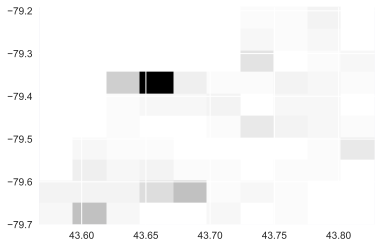

In [195]:
plt.hist2d(gdf_chg_stn['latitude'], gdf_chg_stn['longitude'])

(array([523.,  12.,   6.,   3.,   2.,   1.,   1.,   0.,   0.,   1.]),
 array([ 0. ,  1.5,  3. ,  4.5,  6. ,  7.5,  9. , 10.5, 12. , 13.5, 15. ]),
 <a list of 10 Patch objects>)

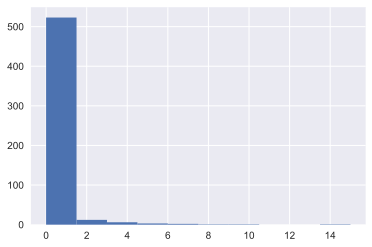

In [196]:
plt.hist(df_TRT_join_chg['charging station'])

(array([470.,  59.,  11.,   2.,   2.,   1.,   2.,   1.,   0.,   1.]),
 array([ 0. ,  7.1, 14.2, 21.3, 28.4, 35.5, 42.6, 49.7, 56.8, 63.9, 71. ]),
 <a list of 10 Patch objects>)

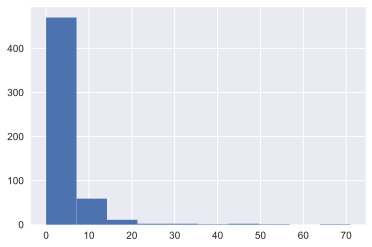

In [197]:
plt.hist(df_TRT_join_chg['restaurant'])

(array([476.,  54.,  15.,   1.,   1.,   0.,   1.,   0.,   0.,   1.]),
 array([ 0. ,  5.6, 11.2, 16.8, 22.4, 28. , 33.6, 39.2, 44.8, 50.4, 56. ]),
 <a list of 10 Patch objects>)

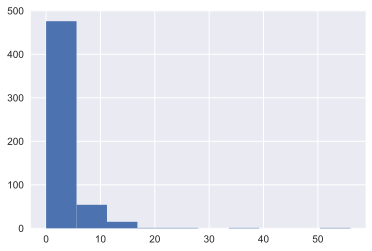

In [198]:
plt.hist(df_TRT_join_chg['parking lots'])

The sample is very unbalanced, and not a normal distribution.  
Need to undersample the ones without any charging station, and normalize all the numbers

In [235]:
# gen dummy(has charging station) to split sample
df_TRT_join_chg['has charging']=0
df_TRT_join_chg.loc[df_TRT_join_chg['charging station']>0,'has charging']=1

In [236]:
df_TRT_join_chg['has charging'].describe()

count    549.000000
mean       0.118397
std        0.323372
min        0.000000
25%        0.000000
50%        0.000000
75%        0.000000
max        1.000000
Name: has charging, dtype: float64

In [237]:
df_TRT_join_chg.to_file('data/processed/shape_join_points.shp')
